# Spike to Spike Regression: Oxford

In [1]:
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader

# Import Slayer from lava-dl
import lava.lib.dl.slayer as slayer

import IPython.display as display
from matplotlib import animation

# Create Dataset
Create a simple PyTorch dataset class.
It shows usage of the `slayer.io` module, providing a way to:
- Easily represent events including graded spikes
- Read/write events in different known binary and numpy formats
- Transform event to tensor for processing it using slayer network and convert a spike tensor back to event
- Display/animate the tensor for visualization

In [2]:
class OxfordDataset(Dataset):
    def __init__(self):
        super(OxfordDataset, self).__init__()
        self.input = slayer.io.read_1d_spikes('input.bs1')
        self.target = slayer.io.read_1d_spikes('output.bs1')
        self.target.t = self.target.t.astype(int)

    def __getitem__(self, _):
        return (
            self.input.fill_tensor(torch.zeros(1, 1, 200, 2000)).squeeze(),     # input dimensions ( batch, channel, number of neurons (200), time (2000ms) )
            self.target.fill_tensor(torch.zeros(1, 1, 200, 2000)).squeeze(),    # target dimensions ( batch, channel, number of neurons (200), time(2000ms) )
        )
    
    def __len__(self):
        return 1    # just one sample for this problem

# Create Network
A slayer network definition follows the standard PyTorch way using `torch.nn.Module`.

The network can be described with a combination of individual `synapse`, `dendrite`, `neuron` and `axon` components. 

For rapid and easy development, slayer provides a block interface - `slayer.block` - which bundles all these individual components into a single unit.

In [3]:
class Network(torch.nn.Module):
    def __init__(self):
        super(Network, self).__init__()
        
        neuron_params = {
            'threshold': 0.1,
            'current_decay': 1,
            'voltage_decay': 0.1,
            'requires_grad': True,
        }

        # Define the network
        # CUBA LIF Dense Block documentation (https://lava-nc.org/lava-lib-dl/slayer/block/block.html#lava.lib.dl.slayer.block.cuba.Dense)
        self.blocks = torch.nn.ModuleList([
            slayer.block.cuba.Dense(neuron_params, 200, 256),   # 200 input neurons, 256 output neurons
            slayer.block.cuba.Dense(neuron_params, 256, 200),   # 256 input neurons, 200 output neurons
        ])

    def forward(self, spike):
        for block in self.blocks:
            spike = block(spike)
        return spike
    
    def export_hdf5(self, filename):
        # Export the network parameters to a HDF5 file
        h = h5py.File(filename, 'w')
        layer = h.create_group('layer')

        for idx, block in enumerate(self.blocks):
            block.export_hdf5(layer.create_group(f"{idx}"))

# Instantiate Network, Optimizer, DataSet and DataLoader
Running the network in GPU is as simple as selecting `torch.device('cuda')`.

In [4]:
# Check if cuda is available and if so, use it
print(torch.cuda.is_available())

print(torch.cuda.device_count())

True
1


In [5]:
trained_folder = 'Trained'
os.makedirs(trained_folder, exist_ok=True)

device = torch.device('cpu')
# device = torch.device('cuda')

net = Network().to(device)

lr = 0.001  # learning rate
weight_decay = 1e-5 
optimizer = torch.optim.Adam(net.parameters(), lr=lr, weight_decay=weight_decay)  

training_set = OxfordDataset()    # Create the dataset
train_loader = DataLoader(dataset=training_set, batch_size=1)   # Create the dataloader

# Visualize the input and output spike train
A `slayer.io.Event` can be visualized by invoking it's `Event.show()` routine. `Event.anim()` instead returns the event visualization animation which can be embedded in notebook or exported as video/gif. Here, we will export a gif animation and visualize it

In [45]:
input_anim = training_set.input.anim(plt.figure(figsize=(10, 10)))
target_anim = training_set.target.anim(plt.figure(figsize=(10, 10)))

# Saving and loading gif for better animation in github
input_anim.save('input.gif', animation.PillowWriter(fps=24), dpi=300)
target_anim.save('target.gif', animation.PillowWriter(fps=24), dpi=300)

In [ ]:
# Interactive animation of the input spike file (GIF)
# display.HTML(input_anim.to_jshtml(fps=24))

In [ ]:
# Interactive animation of the target spike file (GIF)
# display.HTML(target_anim.to_jshtml(fps=24))

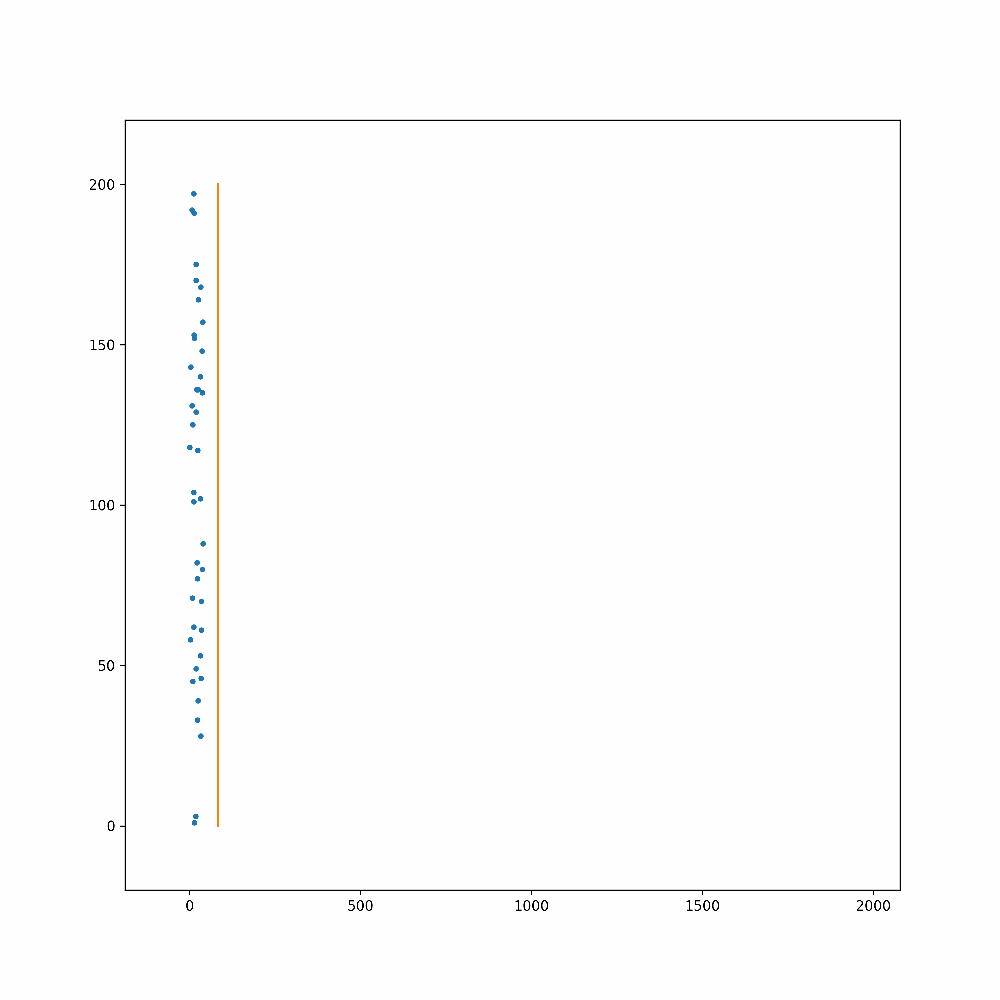

In [9]:
display.Image('input.gif', width=500)

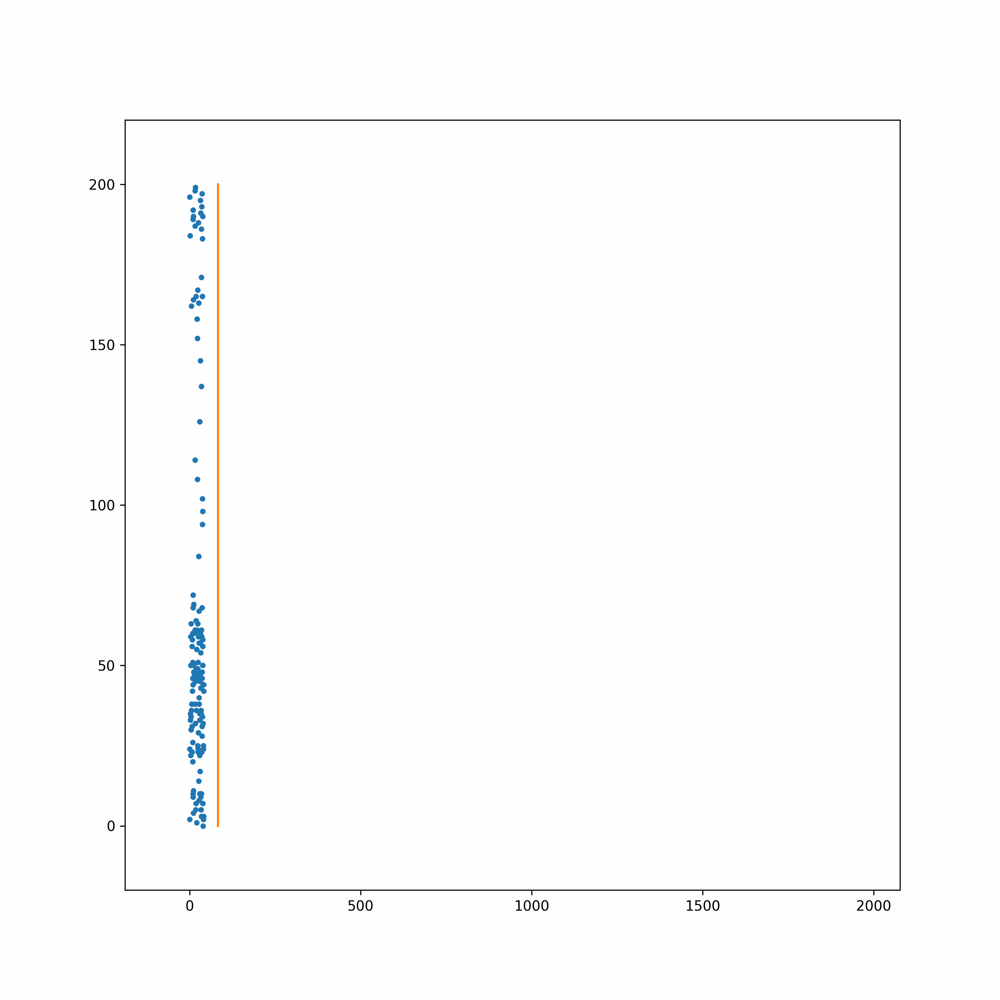

In [47]:
display.Image('target.gif', width=500)

# Error Module
Slayer provides prebuilt loss modules:
1. `slayer.loss.spikeTime` - Precise spike time-based loss when target spike train is known.
2. `slayer.loss.SpikeRate` - Spike rate-based loss when desired rate of the output neuron is known.
3. `slayer.loss.SpikeMax`- Negative log likelihood losses for classification without any rate tuning.  

Since the target spike train is known for this problem, we use `SpikeTime` loss. It uses *van Rossum*-like spike train distnace metric. The input and target spike trains are filtered using a *FIR filter* and the norm of the timeseries is the loss metric.

In [6]:
# time_constant - time constant of the FIR filter
# filter_order - order of the FIR filter. Exponential decay is the first order filter.
error = slayer.loss.SpikeTime(time_constant=2, filter_order=2).to(device)

The following portion just illustrates the SpikeTime loss calculation.
IT IS NOT NEEDED IN PRACTICE

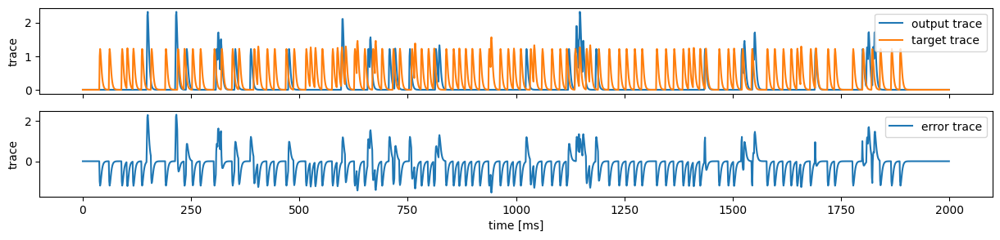

In [7]:
input, target = training_set[0]
output = net(input.unsqueeze(dim=0).to(device))[0]
# just considering first neuron for illustration
output_trace = error.filter(output[0].to(device)).flatten().cpu().data.numpy()
target_trace = error.filter(target[0].to(device)).flatten().cpu().data.numpy()
fig, ax = plt.subplots(2, 1, figsize=(15, 3), sharex=True)
ax[0].plot(output_trace, label='output trace')
ax[0].plot(target_trace, label='target trace')
ax[1].plot(output_trace - target_trace, label='error trace')
ax[0].set_ylabel('trace')
ax[1].set_ylabel('trace')
ax[1].set_xlabel('time [ms]')
for a in ax: a.legend()

# Stats and Assistants
Slayer provides `slayer.utils.LearningStats` as a simple learning statistics logger for training, validation and testing.

In addition, the `slayer.utils.Assistant` module wraps common training, validation and testing routines which helps simplifying the training process.

In [8]:
stats = slayer.utils.LearningStats()
assistant = slayer.utils.Assistant(net, error, optimizer, stats)

# Training Loop
The training loop consists of a looping over epochs and calling the `assistant.train` utility to train.
- `stats` can be printed to get formatted stats printed out.
- `stats.training.best_loss` can be used to find out if the current iteration has the best loss.
- `stats.update()` updates the stats collected for the epoch.
- `stats.save` saves the stats in files.

In [10]:
epochs = 100

for epoch in range(epochs):
    for i, (input, target) in enumerate(train_loader):  # training loop
        output = assistant.train(input, target)
        print(f'\r[Epoch {epoch:3d}/{epochs}] {stats}', end='')

    if stats.training.best_loss:    # If the current epoch has the best loss, save the network
        torch.save(net.state_dict(), trained_folder + '/network.pt')

    stats.update() 
    stats.save(trained_folder + '/')    # Save the stats to a file

[Epoch  99/100] Train loss = 74939.96094 (min = 74336.19531)     accuracy = 0.00000 (max = 0.00000)   

# Plot the learning curves

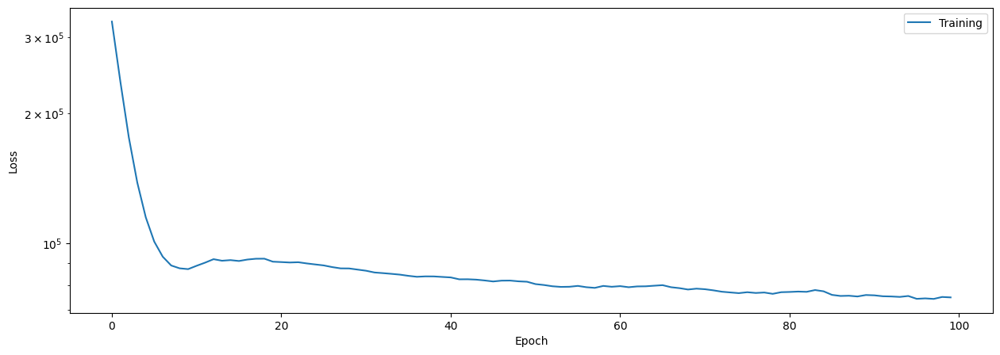

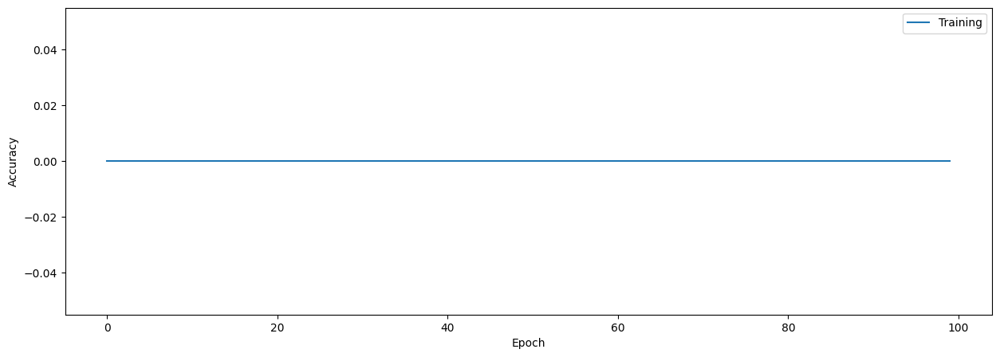

In [12]:
stats.plot(figsize=(15, 5))

# Export the best model
Load the bets model during training and export it as an `hdf5 network`. It is supported by `lava.lib.dl.netx`to automatically load the network **as a lava process**.

In [11]:
net.load_state_dict(torch.load(trained_folder + '/network.pt')) # Load the best network
net.export_hdf5(trained_folder + '/network.net')    # Export the network to a HDF5 file

# Visualize the Network output
Here, we will use the `slayer.io.tensor_to_event` method to convert the torch output spike tensor into a `slayer.io.Event` object and visualize the input and output event.

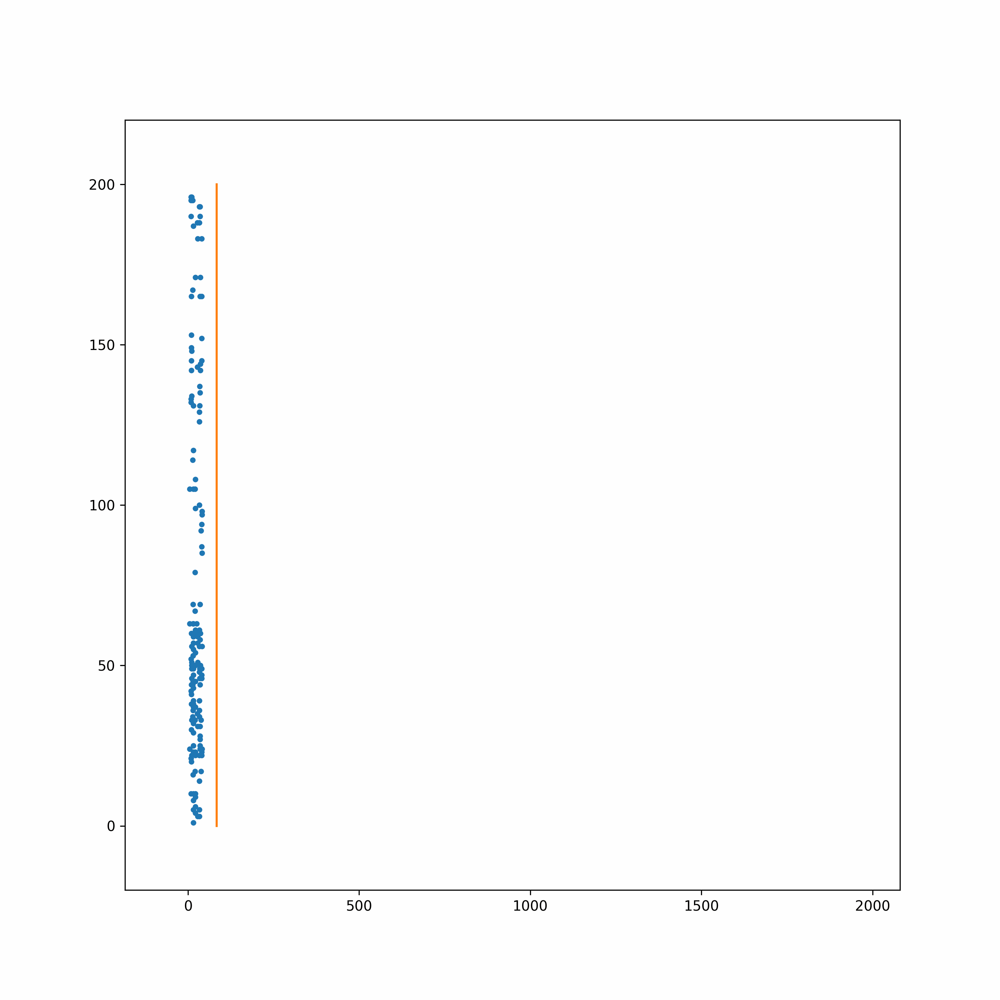

In [13]:
output = net(input.to(device))
event = slayer.io.tensor_to_event(output.cpu().data.numpy())
output_anim = event.anim(plt.figure(figsize=(10, 10)))
# display.HTML(output_anim.to_jshtml(fps=24))
output_anim.save('output.gif', animation.PillowWriter(fps=24), dpi=300)

display.Image('output.gif', width=500)  # Interactive animation of the output spike file (GIF)

# Compare Output V.S Target
Event data can be accessed as `slayer.io.Event.{x, y, c, t p}` for `x-address`, `y-address`, `channel-address`, `timestamp`, and `graded-payload` respectively. This can be used for further processing and visualization of the event data.

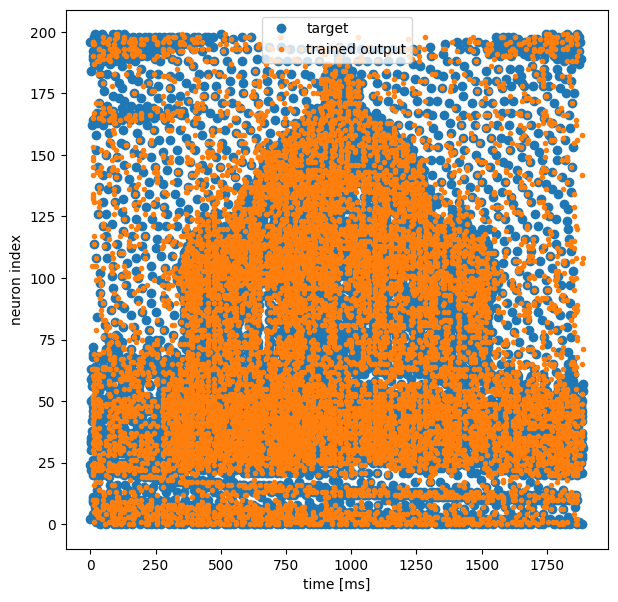

In [15]:
plt.figure(figsize=(7, 7))
plt.plot(training_set.target.t, training_set.target.x, '.', markersize=12, label='target')
plt.plot(event.t, event.x, '.', label='trained output')
plt.xlabel('time [ms]')
plt.ylabel('neuron index')
plt.legend()